In [1]:
!pip install tweepy

In [2]:
import tweepy
import json
import pandas as pd
import numpy as np
from pprint import pprint

In [3]:
from pymongo import MongoClient

In [4]:
client = MongoClient('localhost',27017)
db = client["tweets"]
tweets_coll = db["tweets"]

In [5]:
cursor = tweets_coll.find()

In [6]:
tweets_df = pd.DataFrame(list(cursor))

In [7]:
tweets_df.columns

Index(['_id', 'favorited', 'quote_count', 'contributors', 'truncated', 'text',
       'is_quote_status', 'in_reply_to_status_id', 'reply_count', 'user',
       'search_term', 'filter_level', 'geo', 'id', 'favorite_count', 'lang',
       'source', 'in_reply_to_user_id_str', 'retweeted', 'coordinates',
       'timestamp_ms', 'entities', 'in_reply_to_status_id_str',
       'in_reply_to_screen_name', 'id_str', 'display_text_range', 'place',
       'retweet_count', 'created_at', 'in_reply_to_user_id',
       'retweeted_status', 'extended_tweet', 'possibly_sensitive',
       'extended_entities', 'quoted_status_permalink', 'quoted_status_id',
       'quoted_status', 'quoted_status_id_str'],
      dtype='object')

### We are trying to find the interaction between users based on retweets, mentions and replies

#### We take only the columns which are constant for all tweets, as the rest are variable

In [8]:
tweets_df_new = tweets_df[['_id','search_term','created_at','text']]
tweets_df_new.head()

,_id,search_term,created_at,text
0,1175981513961160705,spiderman,Mon Sep 23 03:53:36 +0000 2019,@TubeAfterDark She hangs upside down like holl...
1,1175981629803761665,spiderman,Mon Sep 23 03:54:03 +0000 2019,Rumor: Sony has an asking price of $10 billion...
2,1175981553446313984,spiderman,Mon Sep 23 03:53:45 +0000 2019,RT @thetablopodcast: This is what happens when...
3,1175981520516861960,spiderman,Mon Sep 23 03:53:37 +0000 2019,RT @thetablopodcast: This is what happens when...
4,1175981711349469185,spiderman,Mon Sep 23 03:54:23 +0000 2019,@Avengers @disneyplus Fuck Disney. They killed...


In [9]:
def get_user_info(tweets_df):
    tweets_df_new["user_id"] = tweets_df.apply(lambda x:x["user"]["id_str"],axis=1)
    tweets_df_new["user_followers_count"] = tweets_df.apply(lambda x:x["user"]["followers_count"],axis=1)
    tweets_df_new["user_screen_name"] = tweets_df.apply(lambda x:x["user"]["screen_name"],axis=1)
    tweets_df_new["user_friends_count"] = tweets_df.apply(lambda x:x["user"]["friends_count"],axis=1)
    
    return tweets_df_new

In [10]:
def get_replies_info(tweets_df):
    tweets_df_new["in_reply_to_user_id"] = tweets_df.apply(lambda x:x["in_reply_to_user_id_str"] if x["in_reply_to_user_id_str"]!=None else None ,axis=1)
    tweets_df_new["in_reply_to_screen_name"] = tweets_df.apply(lambda x:x["in_reply_to_screen_name"] if x["in_reply_to_screen_name"]!=None else None ,axis=1)
    tweets_df_new["in_reply_to_status_id"] = tweets_df.apply(lambda x:x["in_reply_to_status_id_str"] if x["in_reply_to_status_id_str"]!=None else None ,axis=1)
    
    return tweets_df_new
    
    

In [11]:
def get_mention_info(tweets_df):
    tweets_df_new["user_mentions_id"] = tweets_df["entities"].apply(lambda x:list(map(lambda y:y["id_str"],x["user_mentions"])) if x["user_mentions"] else None)
    tweets_df_new["user_mentions_screen_name"] = tweets_df["entities"].apply(lambda x:list(map(lambda y:y["screen_name"],x["user_mentions"])) if x["user_mentions"] else None)
    
    return tweets_df_new

In [12]:
def get_retweets_info(tweets_df):
    tweets_df_new["retweet_screen_name"] = tweets_df["retweeted_status"].apply(lambda x: x["user"]["screen_name"] if x is not np.nan else None)
    tweets_df_new["retweet_user_id"] = tweets_df["retweeted_status"].apply(lambda x: x["user"]["id_str"] if x is not np.nan else None)

### Populating the new tweets Dataframe with the extracted values

In [13]:
get_user_info(tweets_df)
get_replies_info(tweets_df)
get_mention_info(tweets_df)
get_retweets_info(tweets_df)

c:\users\user1\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\user1\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
c:\users\user1\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is tryin

### Building the graph for all the user interactions

In [14]:
import networkx as nx
from matplotlib import pyplot as plt

In [15]:
graph = nx.Graph()

In [16]:
def get_user_interaction(row):
    interaction = set()
    user = [row["user_id"],row["user_screen_name"]]
    if user[0] == None:
        return None,[]
    else:
        if row["retweet_user_id"] != None:
            interaction.add((row["retweet_user_id"],row["retweet_screen_name"]))

        if row["in_reply_to_user_id"] != None:
            interaction.add((row["in_reply_to_user_id"],row["in_reply_to_screen_name"]))

        if row["user_mentions_id"] != None: ## Adding multiple user mentions
            for i in range(len(list(row["user_mentions_id"]))):
                interaction.add((row["user_mentions_id"][i], row["user_mentions_screen_name"][i]))
    return user,interaction
    

In [17]:
for i,row in tweets_df_new.iterrows():
    user,interactions = get_user_interaction(row)
    if len(interactions)>0:
        for interaction in interactions:
            graph.add_edge(str(user[0]),str(interaction[0]))
            graph.node[str(user[0])]["name"] = str(user[1])
            graph.node[str(interaction[0])]["name"] = str(interaction[1])
            
    

In [18]:
plt.figure(figsize = (100,100))
nx.draw(graph,pos=nx.spring_layout(graph),node_color=range(graph.number_of_nodes()),edge_color="black",cmap=plt.cm.PRGn)
plt.savefig('whole_graph.png')

c:\users\user1\appdata\local\programs\python\python37-32\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


###### As we can see, the graph above is too big and has many disconnected components. Hence We try to extract few of the largest connected components.

In [19]:
graph.number_of_nodes()

3994

In [20]:
def visualize_top_subgraphs(num_sub_graphs):
    sub_graphs = sorted(nx.connected_component_subgraphs(graph), key=len, reverse=True)[:num_sub_graphs]
    
    num_rows = (num_sub_graphs//2) if num_sub_graphs%2==0 else (num_sub_graphs//2+1)
    plt.figure(figsize = (100,100))
#     print(num_rows)
    num_cols = 2
    for i,gf in enumerate(sub_graphs):
        plt.subplot(num_rows,num_cols,i+1)
        pos = nx.spring_layout(gf)
        nx.draw(gf,pos=pos,node_color=range(gf.number_of_nodes()),cmap=plt.cm.PRGn)
    
    plt.savefig('subgraphs_graph_{}.png'.format(num_sub_graphs))
#         node_labels = nx.get_node_attributes(gf,'name')
#         nx.draw_networkx_labels(gf, pos=pos, labels = node_labels)

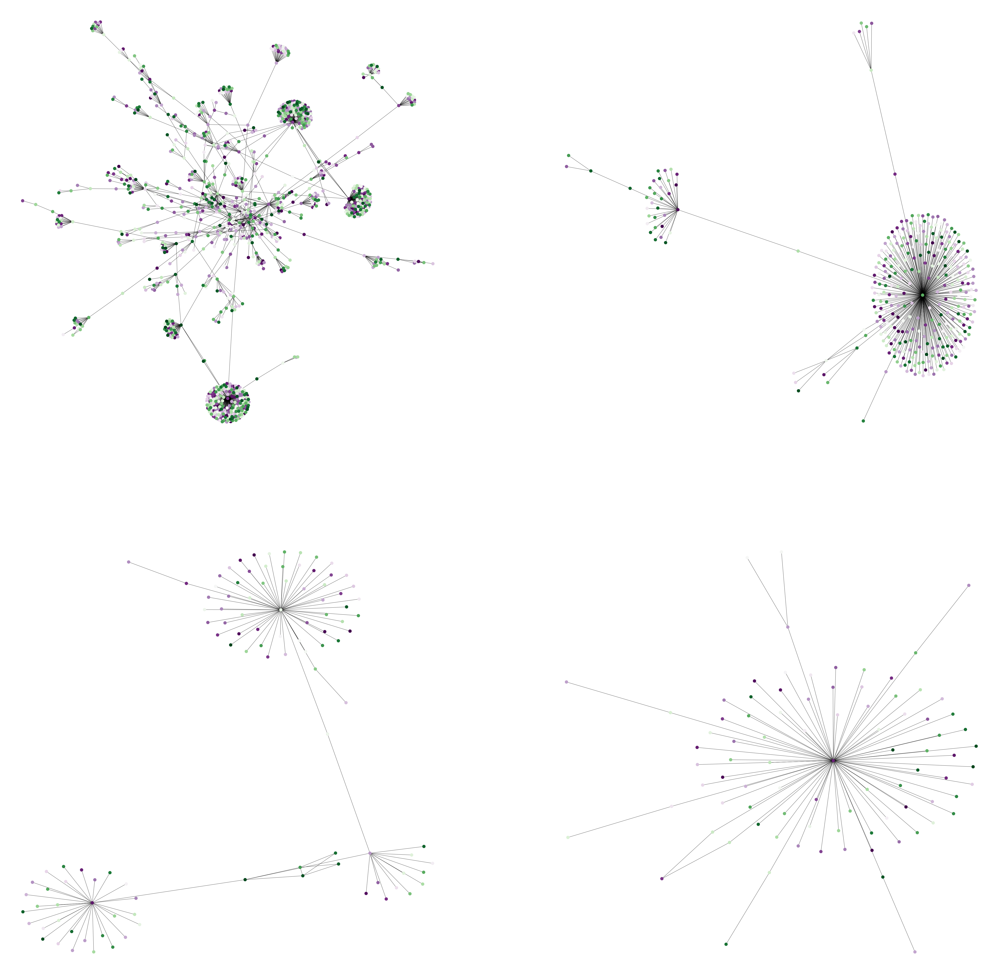

In [21]:
visualize_top_subgraphs(4)

### Plotting the Degree Distribution

c:\users\user1\appdata\local\programs\python\python37-32\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


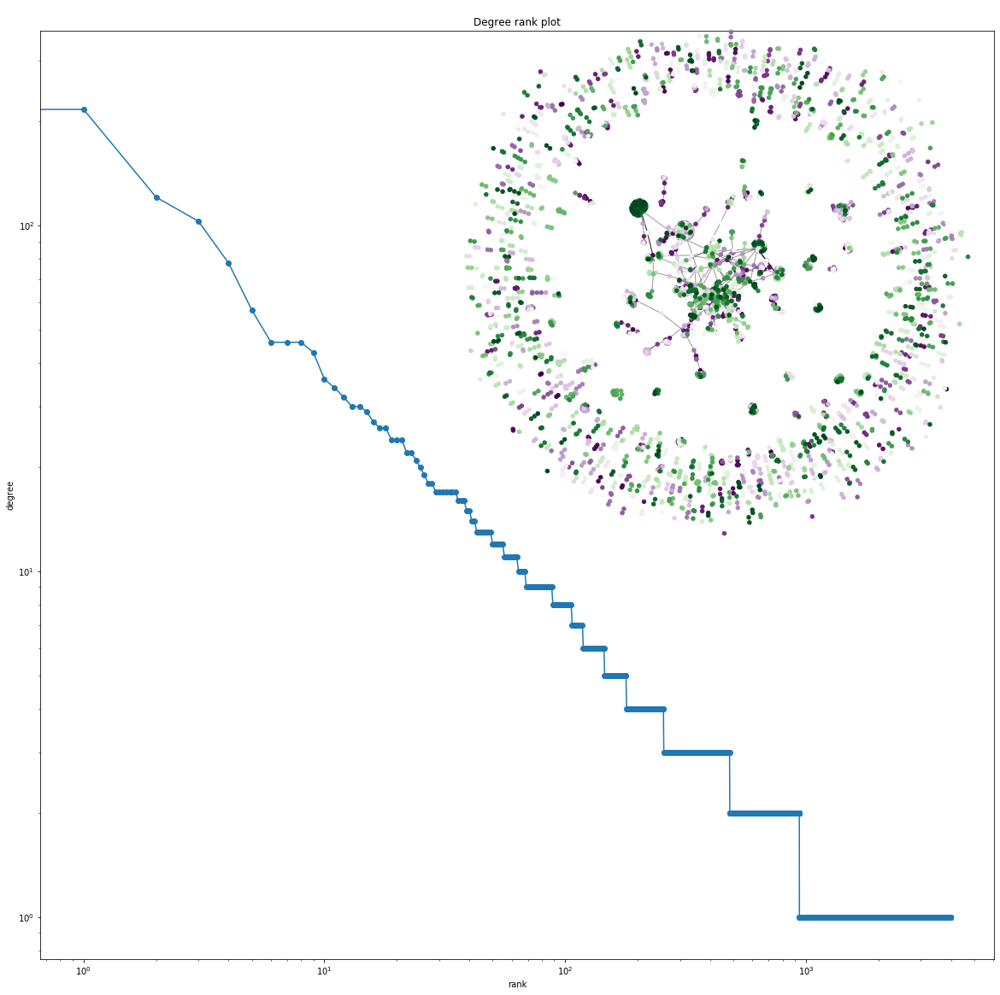

In [23]:

plt.figure(figsize = (20,20))
degree_sequence = sorted([d for n, d in graph.degree()], reverse=True)
# print "Degree sequence", degree_sequence
dmax = max(degree_sequence)

plt.loglog(degree_sequence, marker='o')
plt.title("Degree rank plot")
plt.ylabel("degree")
plt.xlabel("rank")

# draw graph in inset
plt.axes([0.45, 0.45, 0.45, 0.45])
# Gcc = sorted(nx.connected_component_subgraphs(graph), key=len, reverse=True)[0]
pos = nx.spring_layout(graph)
plt.axis('off')
nx.draw_networkx_nodes(graph, pos, node_size=20,node_color=range(graph.number_of_nodes()),cmap=plt.cm.PRGn)
nx.draw_networkx_edges(graph, pos, alpha=0.4)
plt.savefig('degree_rank.png')
plt.show()

### Applying network measures

In [36]:
def ret_highest_nodes(measure,graph,top):
    return sorted(measure(graph).items(),key=lambda x:x[1],reverse=True)[:top]

In [37]:
def print_node_names(node_list,graph):
    for node in node_list:
        print(graph.node[node[0]]["name"] key)

SyntaxError: invalid syntax (<ipython-input-37-3d7d18552574>, line 3)

In [31]:
def plot_graph_centrality(node_list,graph):
    plt.figure(figsize=(100,100))
    pos = nx.spring_layout(graph)
    nx.draw(graph,pos=pos,node_color=range(graph.number_of_nodes()),edge_color="black",cmap=plt.cm.PRGn)
    nx.draw_networkx_nodes(graph, pos=pos, nodelist=node_list, node_size=900, node_color="red")

#### PageRank

In [42]:
highest_nodes_pagerank = ret_highest_nodes(nx.pagerank,graph,10)

In [43]:
print_node_names(highest_nodes_pagerank,graph)

thetablopodcast
lovingbarnes
ChallengeAnim
NickTyson
sofyanboudouni
FuuckYugi
hiswinterchild
ramenjae
KatRamos37
Jac_Mirie


In [44]:
highest_node_pagerank_ids = [node[0] for node in highest_nodes_pagerank]

In [45]:
plot_graph_centrality(highest_node_pagerank_ids,graph)

#### Centrality

In [46]:
highest_nodes_centrality = ret_highest_nodes(nx.degree_centrality,graph,10)

In [47]:
print_node_names(highest_nodes_centrality,graph)

thetablopodcast
lovingbarnes
ChallengeAnim
NickTyson
sofyanboudouni
FuuckYugi
VolkorNSFW
pewposterous
TemptyVA
SpiderMan


In [48]:
highest_node_centrality_ids = [node[0] for node in highest_nodes_centrality]

In [49]:
plot_graph_centrality(highest_node_centrality_ids,graph)

#### Betweenness Centrality

In [50]:
highest_nodes_betweenness = ret_highest_nodes(nx.betweenness_centrality,graph,10)

In [51]:
print_node_names(highest_nodes_betweenness,graph)

lovingbarnes
SPIDEYSK8RBOY
CrepTransformer
ChallengeAnim
bag_bombastic
SpideyVigilante
joeythxnerd
SpiderMan
NickTyson
hiswinterchild


In [52]:
highest_node_betweenness_ids = [node[0] for node in highest_nodes_betweenness]

In [53]:
plot_graph_centrality(highest_node_betweenness_ids,graph)

#### Closeness Centrality

In [54]:
highest_nodes_closeness = ret_highest_nodes(nx.closeness_centrality,graph,10)

In [55]:
print_node_names(highest_nodes_closeness,graph)

thetablopodcast
ChallengeAnim
SPIDEYSK8RBOY
SpideyVigilante
bag_bombastic
Navy_BluInkling
joeythxnerd
DevinScott64
UMarvelite
JuananBrundle


In [56]:
highest_node_closeness_ids = [node[0] for node in highest_nodes_closeness]

In [57]:
plot_graph_centrality(highest_node_closeness_ids,graph)